#AIR QUALITY INDEX
* EDA
* Feature importance
* Linear Regression
* Ridge
* Lasso regression
* Decision Tree
* KNN
* RandomForest Regressor
* XGBoost
* ANN - artificial neural network 

## 1. EDA

In [192]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [193]:
df = pd.read_csv('/content/sample_data/Real_Combine.csv')

In [194]:
df.shape

(1093, 9)

In [195]:
df.head()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4,219.720833
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1,182.187500
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1,154.037500
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6,223.208333
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2,200.645833


In [196]:
df.tail()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
1088,18.1,24.0,11.2,1015.4,56.0,1.8,15.9,25.9,288.416667
1089,17.8,25.0,10.7,1015.8,54.0,2.3,9.4,22.2,256.833333
1090,13.9,24.5,11.4,1015.0,95.0,0.6,8.7,14.8,169.000000
1091,16.3,23.0,9.8,1016.9,78.0,1.1,7.4,16.5,186.041667
1092,16.3,23.4,9.0,1017.3,68.0,1.3,7.8,18.3,185.583333


In [197]:
df.describe()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
count,1093.000000,1093.000000,1093.000000,1093.000000,1093.000000,1093.000000,1093.000000,1093.000000,1092.000000
mean,26.009241,32.482251,19.460201,1008.081885,62.918573,2.003111,6.751510,15.805124,109.090984
std,7.237401,6.679078,7.438653,7.529237,15.709816,0.747541,3.841137,7.308435,84.465790
min,6.700000,9.800000,0.000000,991.500000,20.000000,0.300000,0.400000,1.900000,0.000000
25%,19.300000,27.800000,12.100000,1001.100000,54.000000,1.600000,3.700000,11.100000,41.833333
50%,28.200000,34.200000,21.200000,1008.100000,64.000000,1.900000,6.500000,14.800000,83.458333
75%,31.700000,37.000000,26.000000,1015.000000,74.000000,2.600000,9.100000,18.300000,158.291667
max,38.500000,45.500000,32.700000,1023.200000,98.000000,5.800000,24.400000,57.600000,404.500000


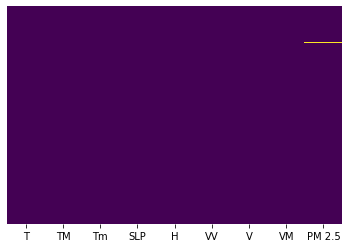

In [198]:
#checking for null values
sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap='viridis')

In [199]:
#dropping the null values as it is very small and that too is in dependent feature

df = df.dropna()

In [200]:
df.shape
#only one row had a null value

(1092, 9)

In [201]:
#dividing the target and predictor variables
x = df.iloc[:,:-1] #independent
y = df.iloc[:,-1] #dependent

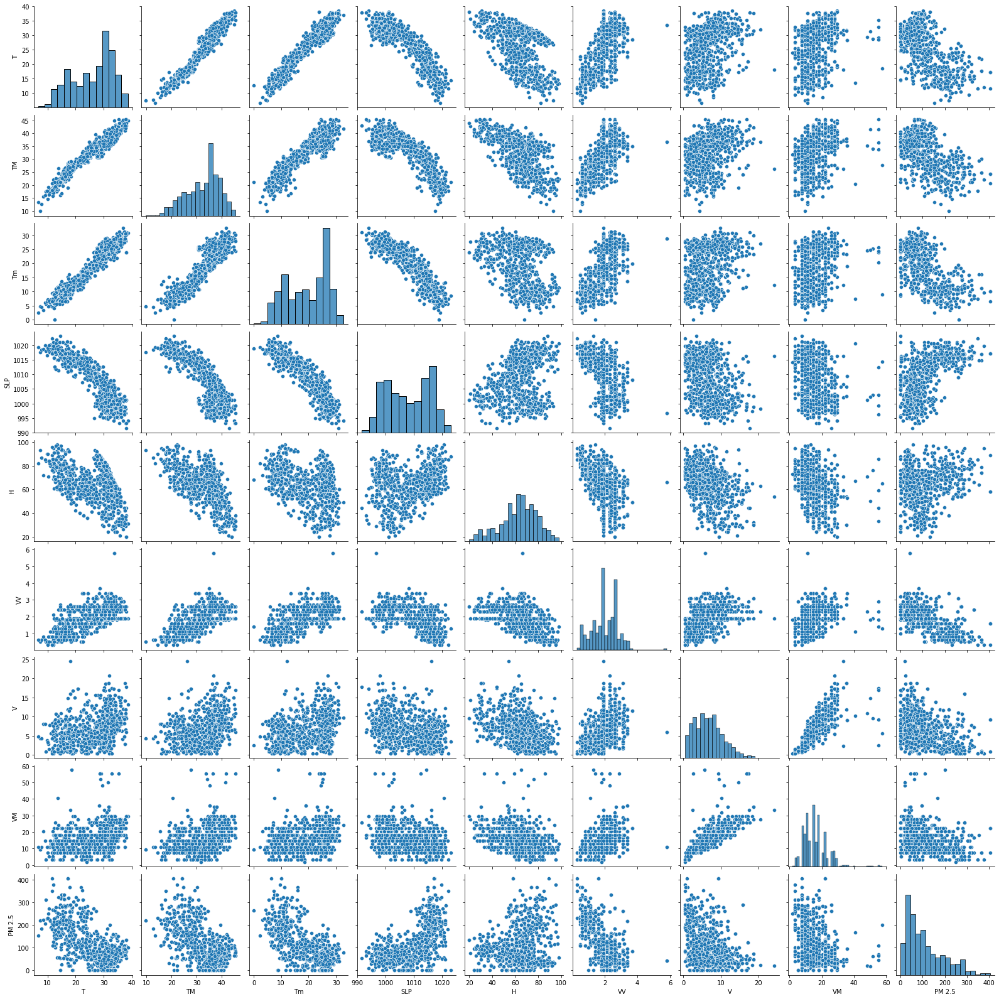

In [202]:
#multivariate analysis
sns.pairplot(df)

In [203]:
#pearson corelation
df.corr()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
T,1.000000,0.967536,0.953719,-0.881409,-0.509299,0.640792,0.301994,0.287738,-0.631462
TM,0.967536,1.000000,0.892031,-0.822958,-0.586681,0.606945,0.292949,0.297011,-0.568409
Tm,0.953719,0.892031,1.000000,-0.917518,-0.287357,0.577240,0.296225,0.266782,-0.673824
SLP,-0.881409,-0.822958,-0.917518,1.000000,0.240256,-0.517915,-0.329838,-0.310704,0.623187
H,-0.509299,-0.586681,-0.287357,0.240256,1.000000,-0.465374,-0.380575,-0.362177,0.138005
VV,0.640792,0.606945,0.577240,-0.517915,-0.465374,1.000000,0.376873,0.342442,-0.573941
V,0.301994,0.292949,0.296225,-0.329838,-0.380575,0.376873,1.000000,0.775655,-0.268530
VM,0.287738,0.297011,0.266782,-0.310704,-0.362177,0.342442,0.775655,1.000000,-0.215854
PM 2.5,-0.631462,-0.568409,-0.673824,0.623187,0.138005,-0.573941,-0.268530,-0.215854,1.000000


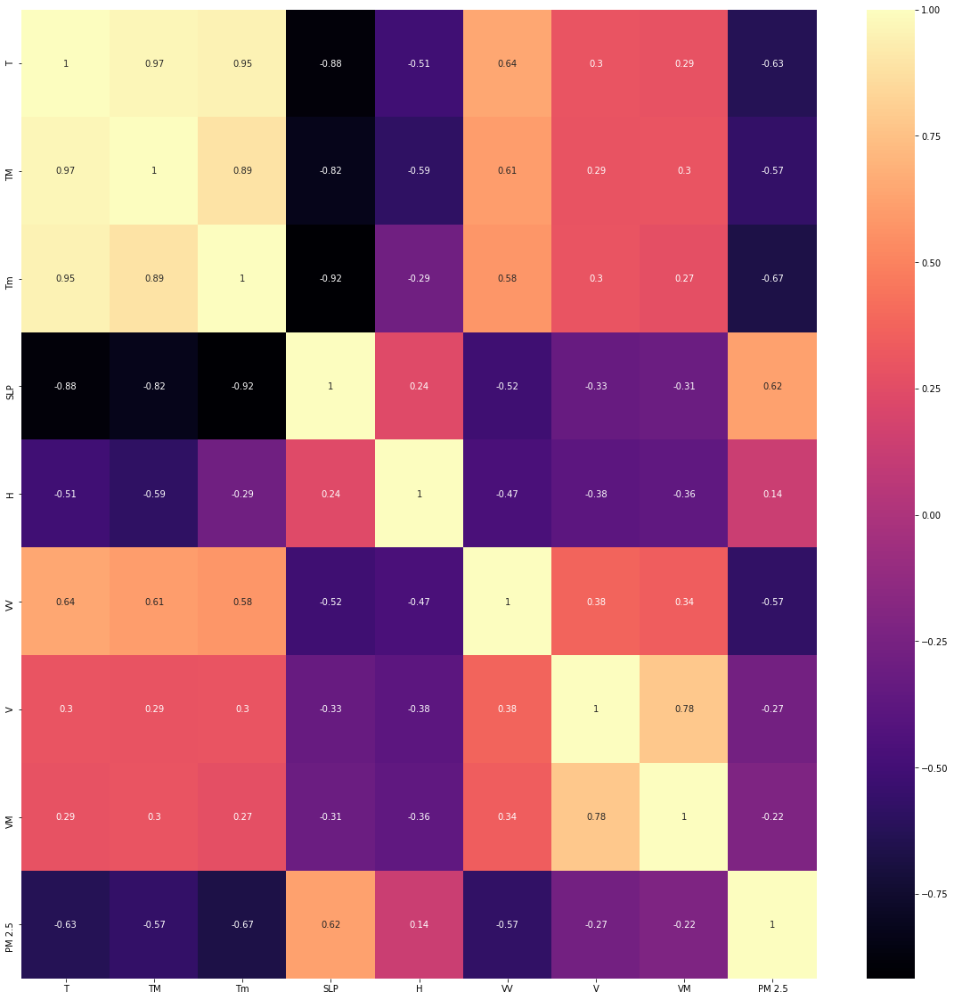

In [204]:
#correlation with heatmap
#correlation of each features in dataset
corrmat = df.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
g = sns.heatmap(df[top_corr_features].corr(), annot=True, cmap='magma')

## 2. Feature importance

Feature importance is an inbuilt class that comes with Tree Based Regressor, we will be using Extra Tree Regressor for extracting the top 10 features for the dataset.

In [205]:
from sklearn.ensemble import ExtraTreesRegressor
et = ExtraTreesRegressor()
et.fit(x,y)

ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=None, oob_score=False,
                    random_state=None, verbose=0, warm_start=False)

In [206]:
et.feature_importances_

array([0.1780761 , 0.09098145, 0.21611645, 0.14414572, 0.08623704,
       0.18979099, 0.05300106, 0.04165118])

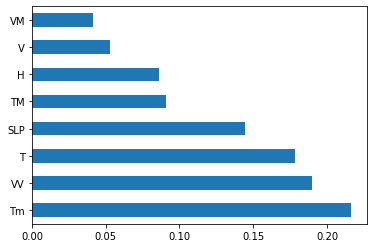

In [207]:
#graph of feature importance
feat_imp = pd.Series(et.feature_importances_, index=x.columns)
feat_imp.nlargest(10).plot(kind='barh')

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


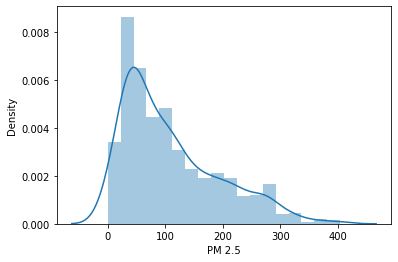

In [208]:
sns.distplot(y)

## 3. Linear Regression

In [209]:
#train test split

from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 4 )

In [210]:
from sklearn.linear_model import LinearRegression

lr = LinearRegression()

lr.fit(x_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [211]:
lr.coef_

array([ -1.45226204,   0.91631431,  -5.14800669,   0.14197819,
        -1.04617142, -36.2825825 ,  -1.41947571,   0.40778042])

In [212]:
lr.intercept_

214.04894898524492

In [213]:
r2_train = lr.score(x_train, y_train)
r2_test = lr.score(x_test, y_test)
r2_train, r2_test

(0.527004722695882, 0.5414627630284115)

In [214]:
from sklearn.model_selection import cross_val_score
score = cross_val_score(lr, x, y, cv=5)
score.mean()

0.4710569304807392

In [215]:
lr_cvs = cvs.mean() 

In [216]:
coeff_df = pd.DataFrame(lr.coef_, x.columns, columns=['coefficient'])
coeff_df

,coefficient
T,-1.452262
TM,0.916314
Tm,-5.148007
SLP,0.141978
H,-1.046171
VV,-36.282582
V,-1.419476
VM,0.407780




Interpreting the coefficients:

* Holding all other features fixed, a 1 unit increase in T is associated with an decrease of 2.690 in AQI PM2.5 .
* Holding all other features fixed, a 1 unit increase in TM is associated with an increase of 0.46 in AQI PM 2.5 .



/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


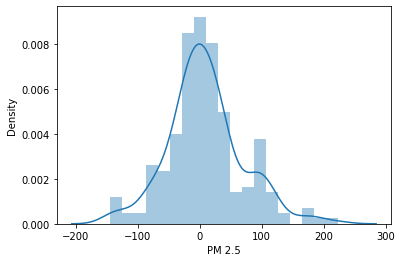

In [217]:
pred = lr.predict(x_test)
sns.distplot(y_test-pred)

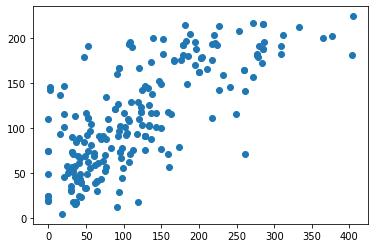

In [218]:
plt.scatter(y_test, pred)


Regression Evaluation Metrics

Here are three common evaluation metrics for regression problems:

Mean Absolute Error (MAE) is the mean of the absolute value of the errors:
$$\frac 1n\sum_{i=1}^n|y_i-\hat{y}_i|$$

Mean Squared Error (MSE) is the mean of the squared errors:
$$\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2$$

Root Mean Squared Error (RMSE) is the square root of the mean of the squared errors:
$$\sqrt{\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2}$$

Comparing these metrics:

* MAE is the easiest to understand, because it's the average error.
* MSE is more popular than MAE, because MSE "punishes" larger errors, which tends to be useful in the real world.
* RMSE is even more popular than MSE, because RMSE is interpretable in the "y" units.

All of these are loss functions, because we want to minimize them.


In [219]:
from sklearn import metrics

mae = metrics.mean_absolute_error(y_test, pred)
mse = metrics.mean_squared_error(y_test, pred)
rmse = np.sqrt(mse)

mae, mse, rmse

(44.55909737067822, 3736.0493480759187, 61.12323083800396)

In [220]:
neg_mse = cross_val_score(lr, x, y, scoring = 'neg_mean_squared_error', cv = 5)
mean_neg_mse = np.mean(neg_mse)
mean_neg_mse

-3686.201777339885

In [221]:
lr_r2_train = r2_train
lr_r2_test = r2_test
lr_cvs = score.mean()
lr_mae = mae
lr_mse = mse
lr_rmse = rmse
lr_neg = mean_neg_mse

In [222]:
import pickle
file = open('linear_regression.pkl', 'wb')
pickle.dump(lr, file)

## 4. Ridge Regression

In [223]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

ridge = Ridge()

parameters = {'alpha':[1e-15,1e-10,1e-8,1e-3,1e-2,1,5,10,20,30,35,40, 100]}

ridge_regressor = GridSearchCV(ridge, parameters, scoring = 'neg_mean_squared_error', cv = 5)

ridge_regressor.fit(x,y)

GridSearchCV(cv=5, error_score=nan,
             estimator=Ridge(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=None, normalize=False, random_state=None,
                             solver='auto', tol=0.001),
             iid='deprecated', n_jobs=None,
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 0.001, 0.01, 1, 5, 10,
                                   20, 30, 35, 40, 100]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='neg_mean_squared_error', verbose=0)

In [224]:
score = cross_val_score(ridge_regressor, x, y, cv=5)
score.mean()

-3681.849050707949

In [225]:
ridge_regressor.best_params_, ridge_regressor.best_score_

({'alpha': 100}, -3663.046660609839)

In [226]:
neg_mse = cross_val_score(ridge_regressor, x, y, scoring = 'neg_mean_squared_error', cv = 5)
mean_neg_mse = np.mean(neg_mse)
mean_neg_mse

-3681.849050707949

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


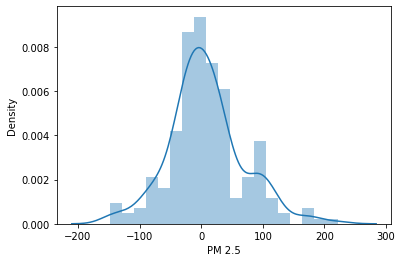

In [227]:
pred = ridge_regressor.predict(x_test)
sns.distplot(y_test-pred)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


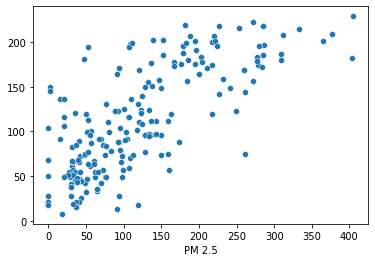

In [228]:
sns.scatterplot(y_test, pred)

In [229]:
mae = metrics.mean_absolute_error(y_test, pred)
mse = metrics.mean_squared_error(y_test, pred)
rmse = np.sqrt(mse)

mae, mse, rmse

(44.691227316816715, 3698.509180317269, 60.81536960602368)

In [230]:
ridge_r2_train = r2_train
ridge_r2_test = r2_test
ridge_cvs = score.mean()
ridge_mae = mae
ridge_mse = mse
ridge_rmse = rmse
ridge_neg = mean_neg_mse

In [231]:
# open a file, where you ant to store the data
file = open('ridge_regression_model.pkl', 'wb')

# dump information to that file
pickle.dump(ridge_regressor, file)

## 5. Lasso

In [232]:
from sklearn.linear_model import Lasso

lasso = Lasso()

parameters = {'alpha':[1e-15,1e-10,1e-8,1e-3,1e-2,1,5,10,20,30,35,40, 100]}

lasso_regressor = GridSearchCV(lasso, parameters, scoring = 'neg_mean_squared_error', cv = 5)

lasso_regressor.fit(x,y)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1444245.8932926375, tolerance: 614.5592033746459
  positive)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1568739.7853185309, tolerance: 678.9710639134809
  positive)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1456481.2303352042, tolerance: 626.8737580831347
  positive)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1425905.9

GridSearchCV(cv=5, error_score=nan,
             estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=1000, normalize=False, positive=False,
                             precompute=False, random_state=None,
                             selection='cyclic', tol=0.0001, warm_start=False),
             iid='deprecated', n_jobs=None,
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 0.001, 0.01, 1, 5, 10,
                                   20, 30, 35, 40, 100]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='neg_mean_squared_error', verbose=0)

In [233]:
score = cross_val_score(lasso_regressor, x, y, cv=5)
score.mean()

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1230291.9514541323, tolerance: 526.7952027303929
  positive)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1147837.2323129422, tolerance: 480.60314599502544
  positive)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1135611.6496365068, tolerance: 487.3116701574935
  positive)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1117629.

-3666.78325343702

In [234]:
lasso_regressor.best_params_, lasso_regressor.best_score_

({'alpha': 1}, -3666.78325343702)

In [235]:
neg_mse = cross_val_score(lasso_regressor, x, y, scoring = 'neg_mean_squared_error', cv = 5)
mean_neg_mse = np.mean(neg_mse)
mean_neg_mse

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1230291.9514541323, tolerance: 526.7952027303929
  positive)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1147837.2323129422, tolerance: 480.60314599502544
  positive)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1135611.6496365068, tolerance: 487.3116701574935
  positive)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1117629.

-3666.78325343702

In [236]:
pred = lasso_regressor.predict(x_test)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


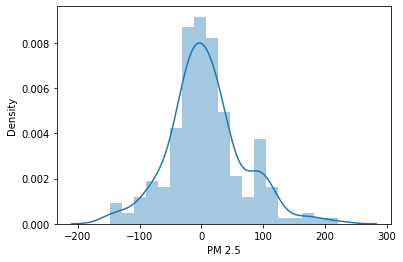

In [237]:
sns.distplot(y_test-pred)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


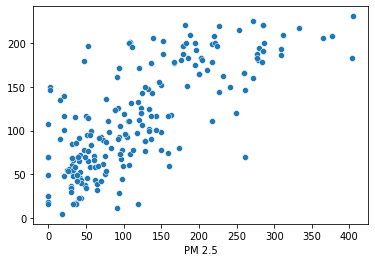

In [238]:
sns.scatterplot(y_test, pred)

In [239]:
mae = metrics.mean_absolute_error(y_test, pred)
mse = metrics.mean_squared_error(y_test, pred)
rmse = np.sqrt(mse)

mae, mse, rmse

(44.395487895401224, 3659.069529684731, 60.49024326025422)

In [240]:
lasso_r2_train = r2_train
lasso_r2_test = r2_test
lasso_cvs = score.mean()
lasso_mae = mae
lasso_mse = mse
lasso_rmse = rmse
lasso_neg = mean_neg_mse

In [241]:
# open a file, where you ant to store the data
file = open('lasso_regression_model.pkl', 'wb')

# dump information to that file
pickle.dump(lasso_regressor, file)

## 6. Decision Tree Regressor

In [307]:
from sklearn.tree import DecisionTreeRegressor

dt = DecisionTreeRegressor(criterion = 'mse')

dt.fit(x_train, y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')

In [308]:
r2_train = dt.score(x_train, y_train)
r2_test = dt.score(x_test, y_test)
r2_train, r2_test

(1.0, 0.7195306443892263)

In [309]:
score = cross_val_score(dt, x, y, cv=5)
score.mean()

0.4635348003250743

In [245]:
from IPython.display import Image
from sklearn.externals.six import StringIO
from sklearn.tree import export_graphviz
import pydotplus

In [246]:
features = list(df.columns[:-1])
features

['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM']

In [247]:
dot_data = StringIO()
export_graphviz(dt, out_file=dot_data, feature_names=features, filled=True, rounded=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.859214 to fit



/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


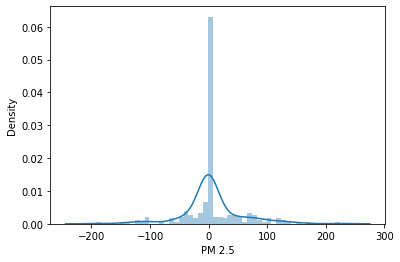

In [248]:
pred = dt.predict(x_test)
sns.distplot(y_test-pred)

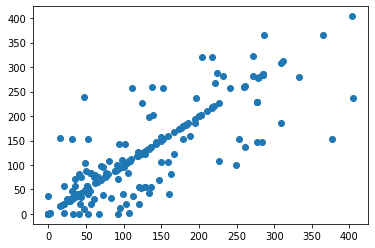

In [249]:

plt.scatter(y_test, pred)

In [250]:
#hyperparameter tuning

params = {
    'splitter': ['best', 'random'],
    'max_depth': [ 3, 4, 5, 6, 8, 10, 12, 15],
    'min_samples_leaf': [1,2,3,4,5],
    'min_weight_fraction_leaf': [0.1,0.2,0.3,0.4],
    'max_features' : ["auto","log2","sqrt",None ],
    'max_leaf_nodes': [None,10,20,30,40,50,60,70]
}

random_search = GridSearchCV(dt, param_grid=params, scoring='neg_mean_squared_error', n_jobs=-1, cv=10, verbose=3)

In [251]:
def timer(start_time=None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec = divmod((datetime.now() - start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec, 60)
        print('\n Time taken: %i hours %i minutes and %s seconds.' % (thour, tmin, round(tsec, 2)))

In [252]:
from datetime import datetime
# Here we go
start_time = timer(None) # timing starts from this point for "start_time" variable
random_search.fit(x,y)
timer(start_time) # timing ends here for "start_time" variable

Fitting 10 folds for each of 10240 candidates, totalling 102400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:   11.4s
[Parallel(n_jobs=-1)]: Done 8138 tasks      | elapsed:   25.6s
[Parallel(n_jobs=-1)]: Done 15306 tasks      | elapsed:   47.2s
[Parallel(n_jobs=-1)]: Done 24522 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 35786 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 49098 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 64458 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 81866 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 101322 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 102400 out of 102400 | elapsed:  4.9min finished



 Time taken: 0 hours 4 minutes and 54.63 seconds.


In [253]:
random_search.best_params_, random_search.best_score_

({'max_depth': 5,
  'max_features': None,
  'max_leaf_nodes': 40,
  'min_samples_leaf': 5,
  'min_weight_fraction_leaf': 0.1,
  'splitter': 'best'},
 -3131.6489619178874)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


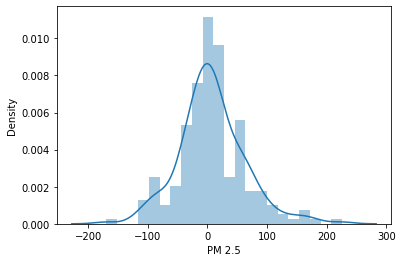

In [254]:
pred = random_search.predict(x_test)
sns.distplot(y_test-pred)

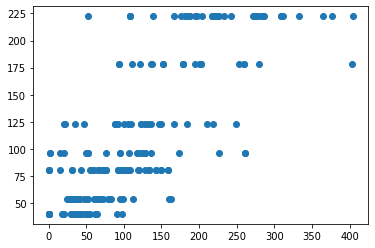

In [255]:
plt.scatter(y_test, pred)

In [256]:
mae = metrics.mean_absolute_error(y_test, pred)
mse = metrics.mean_squared_error(y_test, pred)
rmse = np.sqrt(mse)

mae, mse, rmse

(40.73923340275368, 3172.6802550433704, 56.32655017878665)

In [257]:
neg_mse = cross_val_score(random_search, x, y, scoring = 'neg_mean_squared_error', cv = 5)
mean_neg_mse = np.mean(neg_mse)


Fitting 10 folds for each of 10240 candidates, totalling 102400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 380 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 3452 tasks      | elapsed:   10.3s
[Parallel(n_jobs=-1)]: Done 8572 tasks      | elapsed:   24.6s
[Parallel(n_jobs=-1)]: Done 15740 tasks      | elapsed:   45.8s
[Parallel(n_jobs=-1)]: Done 24956 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 36220 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 49532 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 64892 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 82300 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 101756 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 102400 out of 102400 | elapsed:  4.9min finished


Fitting 10 folds for each of 10240 candidates, totalling 102400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 380 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 3452 tasks      | elapsed:   10.2s
[Parallel(n_jobs=-1)]: Done 8572 tasks      | elapsed:   23.9s
[Parallel(n_jobs=-1)]: Done 15740 tasks      | elapsed:   44.4s
[Parallel(n_jobs=-1)]: Done 24956 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 36220 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 49532 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 64892 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 82300 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 101756 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 102400 out of 102400 | elapsed:  4.7min finished


Fitting 10 folds for each of 10240 candidates, totalling 102400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 380 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 3452 tasks      | elapsed:    9.9s
[Parallel(n_jobs=-1)]: Done 8572 tasks      | elapsed:   23.7s
[Parallel(n_jobs=-1)]: Done 15740 tasks      | elapsed:   44.4s
[Parallel(n_jobs=-1)]: Done 24956 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 36220 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 49532 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 64892 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 82300 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 101756 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 102400 out of 102400 | elapsed:  4.7min finished


Fitting 10 folds for each of 10240 candidates, totalling 102400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 380 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 3452 tasks      | elapsed:    9.9s
[Parallel(n_jobs=-1)]: Done 8572 tasks      | elapsed:   23.6s
[Parallel(n_jobs=-1)]: Done 15740 tasks      | elapsed:   43.7s
[Parallel(n_jobs=-1)]: Done 24956 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 36220 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 49532 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 64892 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 82300 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 101756 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 102400 out of 102400 | elapsed:  4.7min finished


Fitting 10 folds for each of 10240 candidates, totalling 102400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 380 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 3452 tasks      | elapsed:   10.0s
[Parallel(n_jobs=-1)]: Done 8572 tasks      | elapsed:   23.6s
[Parallel(n_jobs=-1)]: Done 15740 tasks      | elapsed:   43.9s
[Parallel(n_jobs=-1)]: Done 24956 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 36220 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 49532 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 64892 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 82300 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 101756 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 102400 out of 102400 | elapsed:  4.7min finished


In [ ]:
dt_r2_train = r2_train
dt_r2_test = r2_test

dt_mae = mae
dt_mse = mse
dt_rmse = rmse
dt_neg = mean_neg_mse

In [310]:
dt_cvs = score.mean()

In [258]:
# open a file, where you ant to store the data
file = open('decision_regression_model.pkl', 'wb')

# dump information to that file
pickle.dump(random_search, file)

## 7. KNN

In [259]:
from sklearn.neighbors import KNeighborsRegressor

knn = KNeighborsRegressor(n_neighbors=1)
knn.fit(x_train, y_train)

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=1, p=2,
                    weights='uniform')

In [260]:
r2_train = knn.score(x_train, y_train)
r2_test = knn.score(x_test, y_test)

r2_train, r2_test

(1.0, 0.5366101487151207)

In [261]:
score = cross_val_score(knn, x, y, cv=5)
score.mean()

0.39387489016756577

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


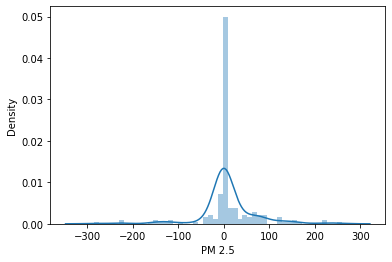

In [262]:
pred = knn.predict(x_test)
sns.distplot(y_test-pred)

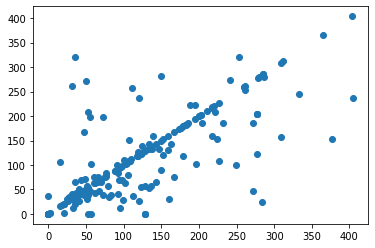

In [263]:
plt.scatter(y_test, pred)

In [264]:
mae = metrics.mean_absolute_error(y_test, pred)
mse = metrics.mean_squared_error(y_test, pred)
rmse = np.sqrt(mse)

mae, mse, rmse

(30.059969558599693, 3775.5872636035015, 61.44580753479851)

In [265]:
#hyperparameter tuning

accuracy_rate = []

for i in range(1,41):
  knn = KNeighborsRegressor(n_neighbors=i)
  score = cross_val_score(knn, x, y, scoring='neg_mean_squared_error', cv=5)
  accuracy_rate.append(score.mean())

Text(0, 0.5, 'Accuracy Rate')

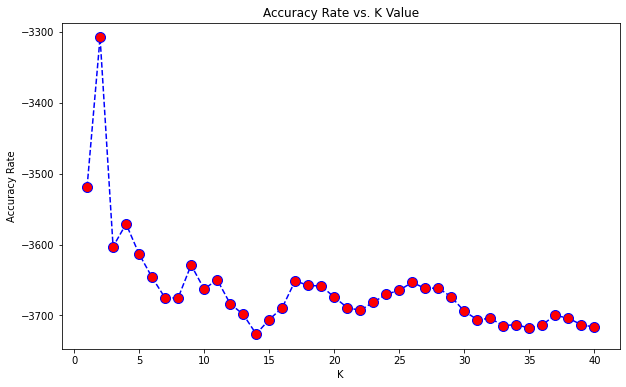

In [266]:
plt.figure(figsize=(10,6))
plt.plot(range(1,41),accuracy_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)
#plt.plot(range(1,40),accuracy_rate,color='blue', linestyle='dashed', marker='o',
 #        markerfacecolor='red', markersize=10)
plt.title('Accuracy Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Accuracy Rate')

In [267]:
knn = KNeighborsRegressor(n_neighbors=3)

knn.fit(x_train,y_train)
pred = knn.predict(x_test)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


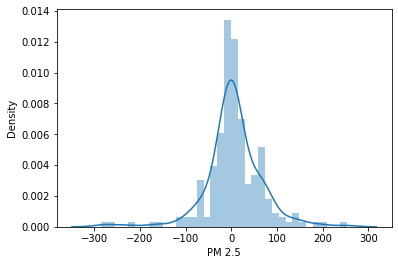

In [268]:
sns.distplot(y_test-pred)

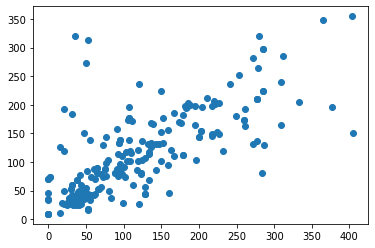

In [269]:
plt.scatter(y_test, pred)

In [270]:
mae = metrics.mean_absolute_error(y_test, pred)
mse = metrics.mean_squared_error(y_test, pred)
rmse = np.sqrt(mse)

mae, mse, rmse

(40.42755580923389, 3952.060003655435, 62.8654118228413)

In [271]:
neg_mse = cross_val_score(knn, x, y, scoring = 'neg_mean_squared_error', cv = 5)
mean_neg_mse = np.mean(neg_mse)
knn_r2_train = r2_train
knn_r2_test = r2_test
knn_cvs = score.mean()
knn_mae = mae
knn_mse = mse
knn_rmse = rmse
knn_neg = mean_neg_mse

In [272]:
file = open('knn_regression_model.pkl', 'wb')

# dump information to that file
pickle.dump(knn, file)



## 8. RandomForest

In [273]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()
rf.fit(x_train, y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [274]:
r2_train = rf.score(x_train, y_train)
r2_test = rf.score(x_test, y_test)

r2_train, r2_test

(0.9751146761951747, 0.8190366139309428)

In [275]:
score = cross_val_score(rf, x, y, cv=5)
score.mean()

0.7229939801686732

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


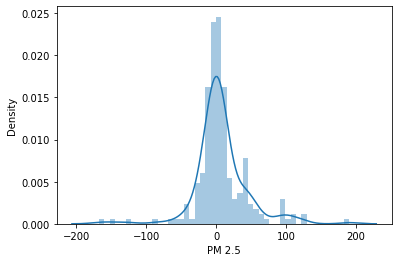

In [276]:
pred = rf.predict(x_test)
sns.distplot(y_test-pred)

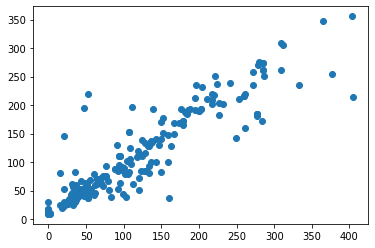

In [277]:
plt.scatter(y_test, pred)

In [278]:
#hyperparameter tuning

from sklearn.model_selection import RandomizedSearchCV
#num of trees in randomforest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]
max_features = ['auto', 'sqrt'] #num of features to consider at every split
max_depth = [int(x) for x in np.linspace(5, 30, num=6)] #max num of levels in tree
min_samples_split = [2,5,10,15,100] #min num of samples required to split
min_samples_leaf = [1,2,5,10] #min number of samples required at each leaf node

In [279]:
random_grid = {
    'n_estimators': n_estimators,
    'max_features': max_features,
    'max_depth': max_depth,
    'min_samples_split': min_samples_split,
    'min_samples_leaf': min_samples_leaf
    }

rf_random = RandomizedSearchCV(estimator = rf, param_distributions=random_grid, scoring = 'neg_mean_squared_error', n_iter=100,
                               cv = 5, verbose=2, random_state=4, n_jobs=1)

rf_random.fit(x_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] n_estimators=900, min_samples_split=2, min_samples_leaf=1, max_features=sqrt, max_depth=30 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  n_estimators=900, min_samples_split=2, min_samples_leaf=1, max_features=sqrt, max_depth=30, total=   1.9s
[CV] n_estimators=900, min_samples_split=2, min_samples_leaf=1, max_features=sqrt, max_depth=30 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.9s remaining:    0.0s


[CV]  n_estimators=900, min_samples_split=2, min_samples_leaf=1, max_features=sqrt, max_depth=30, total=   1.9s
[CV] n_estimators=900, min_samples_split=2, min_samples_leaf=1, max_features=sqrt, max_depth=30 
[CV]  n_estimators=900, min_samples_split=2, min_samples_leaf=1, max_features=sqrt, max_depth=30, total=   1.9s
[CV] n_estimators=900, min_samples_split=2, min_samples_leaf=1, max_features=sqrt, max_depth=30 
[CV]  n_estimators=900, min_samples_split=2, min_samples_leaf=1, max_features=sqrt, max_depth=30, total=   1.9s
[CV] n_estimators=900, min_samples_split=2, min_samples_leaf=1, max_features=sqrt, max_depth=30 
[CV]  n_estimators=900, min_samples_split=2, min_samples_leaf=1, max_features=sqrt, max_depth=30, total=   1.9s
[CV] n_estimators=600, min_samples_split=2, min_samples_leaf=1, max_features=sqrt, max_depth=25 
[CV]  n_estimators=600, min_samples_split=2, min_samples_leaf=1, max_features=sqrt, max_depth=25, total=   1.3s
[CV] n_estimators=600, min_samples_split=2, min_samp

[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed: 11.8min finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=RandomForestRegressor(bootstrap=True,
                                                   ccp_alpha=0.0,
                                                   criterion='mse',
                                                   max_depth=None,
                                                   max_features='auto',
                                                   max_leaf_nodes=None,
                                                   max_samples=None,
                                                   min_impurity_decrease=0.0,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   n_estimators=100,
                              

In [280]:
rf_random.best_params_

{'max_depth': 30,
 'max_features': 'auto',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 1100}

In [281]:
rf_random.best_score_

-1506.7268607218464

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


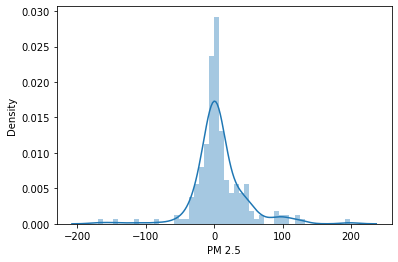

In [282]:
predictions=rf_random.predict(x_test)
sns.distplot(y_test-predictions)

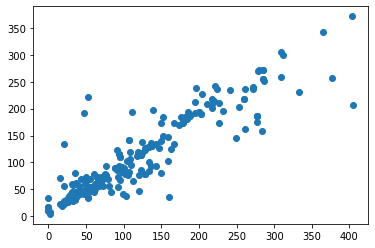

In [283]:
plt.scatter(y_test,predictions)

In [284]:
mae = metrics.mean_absolute_error(y_test, predictions)
mse = metrics.mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)

mae, mse, rmse

(22.931456811263388, 1487.0994631277076, 38.562928611915716)

In [286]:

rf_r2_train = r2_train
rf_r2_test = r2_test
rf_cvs = score.mean()
rf_mae = mae
rf_mse = mse
rf_rmse = rmse


In [287]:
# open a file, where you ant to store the data
file = open('random_forest_regression_model.pkl', 'wb')

# dump information to that file
pickle.dump(rf_random, file)

## 9. XGBoost

In [288]:
import xgboost as xgb

xgbr = xgb.XGBRegressor()

xgbr.fit(x_train, y_train)

[17:40:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

In [289]:
r2_train = xgbr.score(x_train, y_train)
r2_test = xgbr.score(x_test, y_test)

r2_train, r2_test

(0.8570437131041544, 0.7509247298380617)

In [290]:
score = cross_val_score(xgbr, x, y, cv = 5)
score.mean()

[17:40:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[17:40:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[17:40:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[17:40:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[17:40:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


0.6582827367763413

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


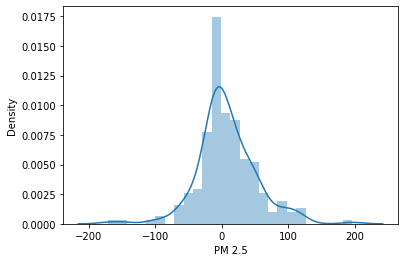

In [291]:
pred = xgbr.predict(x_test)
sns.distplot(y_test-pred)

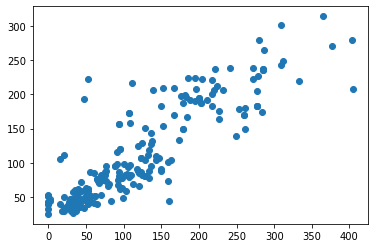

In [292]:
plt.scatter(y_test, pred)

In [293]:
#hyperparameter tuning

#num of trees
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]
learning_rate = ['0.05','0.1', '0.2','0.3','0.5','0.6'] #learning rate parameters
max_depth = [int(x) for x in np.linspace(5, 30, num=6)] #max levels in tree
subsample = [0.7,0.6,0.8]
# Minimum child weight parameters
min_child_weight=[3,4,5,6,7]

random_grid = {
    'n_estimators': n_estimators,
    'learning_rate': learning_rate,
    'max_depth': max_depth,
    'subsample': subsample,
    'min_child_weight': min_child_weight
}

xgb_random = RandomizedSearchCV(estimator=xgbr, param_distributions = random_grid, scoring = 'neg_mean_squared_error',
                                n_iter = 100, cv = 5, verbose = 2, random_state = 4, n_jobs = 1)

xgb_random.fit(x_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] subsample=0.6, n_estimators=1200, min_child_weight=6, max_depth=5, learning_rate=0.5 
[17:40:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  subsample=0.6, n_estimators=1200, min_child_weight=6, max_depth=5, learning_rate=0.5, total=   0.7s
[CV] subsample=0.6, n_estimators=1200, min_child_weight=6, max_depth=5, learning_rate=0.5 
[17:40:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s remaining:    0.0s


[CV]  subsample=0.6, n_estimators=1200, min_child_weight=6, max_depth=5, learning_rate=0.5, total=   0.7s
[CV] subsample=0.6, n_estimators=1200, min_child_weight=6, max_depth=5, learning_rate=0.5 
[17:40:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  subsample=0.6, n_estimators=1200, min_child_weight=6, max_depth=5, learning_rate=0.5, total=   0.7s
[CV] subsample=0.6, n_estimators=1200, min_child_weight=6, max_depth=5, learning_rate=0.5 
[17:40:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  subsample=0.6, n_estimators=1200, min_child_weight=6, max_depth=5, learning_rate=0.5, total=   0.7s
[CV] subsample=0.6, n_estimators=1200, min_child_weight=6, max_depth=5, learning_rate=0.5 
[17:40:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[CV]  subsample=0.6, n_estim

[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:  7.8min finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=XGBRegressor(base_score=0.5, booster='gbtree',
                                          colsample_bylevel=1,
                                          colsample_bynode=1,
                                          colsample_bytree=1, gamma=0,
                                          importance_type='gain',
                                          learning_rate=0.1, max_delta_step=0,
                                          max_depth=3, min_child_weight=1,
                                          missing=None, n_estimators=100,
                                          n_jobs=1, nthread=None,
                                          objective='reg:linear',
                                          random_state=0, reg_alpha=...
                   param_distributions={'learning_rate': ['0.05', '0.1', '0.2',
                                                          '0.3', '0.5', '0.6'],
                            

In [294]:
xgb_random.best_params_, xgb_random.best_score_

({'learning_rate': '0.1',
  'max_depth': 10,
  'min_child_weight': 3,
  'n_estimators': 900,
  'subsample': 0.8},
 -1365.4860759797616)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


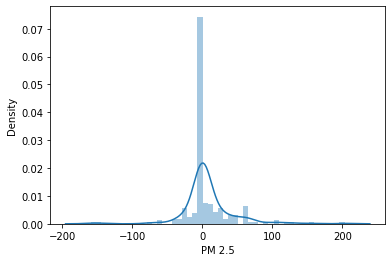

In [295]:
pred = xgb_random.predict(x_test)
sns.distplot(y_test-pred)

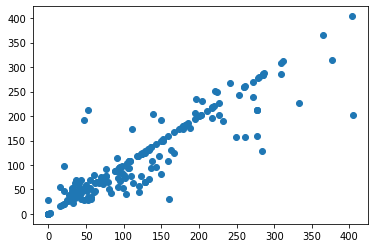

In [296]:
plt.scatter(y_test, pred)

In [297]:
mae = metrics.mean_absolute_error(y_test, pred)
mse = metrics.mean_squared_error(y_test, pred)
rmse = np.sqrt(mse)

mae, mse, rmse

(17.80509114524001, 1314.4110770439677, 36.25480764042153)

In [298]:

xgb_r2_train = r2_train
xgb_r2_test = r2_test
xgb_cvs = score.mean()
xgb_mae = mae
xgb_mse = mse
xgb_rmse = rmse


In [299]:
# open a file, where you ant to store the data
file = open('xgb_regression_model.pkl', 'wb')

# dump information to that file
pickle.dump(xgb_random, file)

## 10. ANN

In [300]:
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LeakyReLU, PReLU, ELU
from keras.layers import Dropout

In [301]:
ann = Sequential()

#input layer
ann.add(Dense(128, kernel_initializer='normal', input_dim = x_train.shape[1], activation='relu'))

#hidden_layers
ann.add(Dense(256, kernel_initializer='normal', activation='relu'))
ann.add(Dense(256, kernel_initializer='normal', activation='relu'))
ann.add(Dense(256, kernel_initializer='normal', activation='relu'))

#output layer
ann.add(Dense(1, kernel_initializer='normal', activation='linear'))

#compiling
ann.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])

ann.summary()

model_history = ann.fit(x_train, y_train, validation_split=0.33, batch_size=10, epochs=100)

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_40 (Dense)             (None, 128)               1152      
_________________________________________________________________
dense_41 (Dense)             (None, 256)               33024     
_________________________________________________________________
dense_42 (Dense)             (None, 256)               65792     
_________________________________________________________________
dense_43 (Dense)             (None, 256)               65792     
_________________________________________________________________
dense_44 (Dense)             (None, 1)                 257       
Total params: 166,017
Trainable params: 166,017
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
59/59 [==============================] - 1s 8ms/step - loss: 71.2657 - mean_absolute_error: 71.2657 - 

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


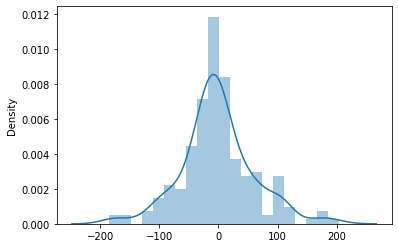

In [302]:
pred = ann.predict(x_test)
sns.distplot(y_test.values.reshape(-1,1)-pred)

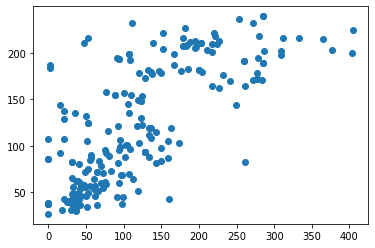

In [303]:
plt.scatter(y_test, pred)

In [304]:
mae = metrics.mean_absolute_error(y_test, pred)
mse = metrics.mean_squared_error(y_test, pred)
rmse = np.sqrt(mse)

mae, mse, rmse

(44.09456023008675, 3769.3233071513127, 61.394814985887145)

In [305]:
# open a file, where you ant to store the data
file = open('ann_regression_model.pkl', 'wb')

# dump information to that file
pickle.dump(ann, file)

TypeError: ignored

## 12. Tabular info

In [311]:
from tabulate import tabulate
models = pd.DataFrame({
                          'Model': ['Linear Regression',
                                    'Ridge', 
                                    'Lasso', 
                                    'Decision Tree', 
                                    'KNN',
                                    "Random Forest",
                                    'XGBoost'
                                    ],
                       
                          'R2_train': [lr_r2_train,
                                       ridge_r2_train,
                                       lasso_r2_train,
                                       dt_r2_train,
                                       knn_r2_train,
                                       rf_r2_train,
                                       xgb_r2_train
                                         ],
                       
                             'R2_test':[lr_r2_test,
                                        ridge_r2_test,
                                        lasso_r2_test,
                                        dt_r2_test,
                                        knn_r2_test,
                                        rf_r2_test,
                                        xgb_r2_test
                             ],
                       
                            'Cross_validation_Score': [lr_cvs,
                                                       ridge_cvs,
                                                       lasso_cvs,
                                                       dt_cvs,
                                                       knn_cvs,
                                                       rf_cvs,
                                                       xgb_cvs
                                         ],
                       
                             'MAE':[lr_mae,
                                    ridge_mae,
                                    lasso_mae,
                                    dt_mae,
                                    knn_mae,
                                    rf_mae,
                                    xgb_mae
                             ],
                              'MSE': [lr_mse,
                                      ridge_mse,
                                      lasso_mse,
                                      dt_mse,
                                      knn_mse,
                                      rf_mse,
                                      xgb_mse
                                         ],
                       
                             'RMSE':[lr_mse,
                                     ridge_mse,
                                     lasso_mse,
                                     dt_mse,
                                     knn_mse,
                                     rf_mse,
                                     xgb_mse
                             
                                          ]})


print(tabulate(models , headers = ['Model' , 'R2_train' , 'R2_test', 'Cross_validation_Score',
'MAE', 'MSE', 'RMSE'] , tablefmt = 'psql' , showindex =False))

+-------------------+------------+-----------+--------------------------+---------+---------+---------+
| Model             |   R2_train |   R2_test |   Cross_validation_Score |     MAE |     MSE |    RMSE |
|-------------------+------------+-----------+--------------------------+---------+---------+---------|
| Linear Regression |   0.527005 |  0.541463 |                 0.471057 | 44.5591 | 3736.05 | 3736.05 |
| Ridge             |   0.527005 |  0.541463 |             -3681.85     | 44.6912 | 3698.51 | 3698.51 |
| Lasso             |   0.527005 |  0.541463 |             -3666.78     | 44.3955 | 3659.07 | 3659.07 |
| Decision Tree     |   1        |  0.685559 |                 0.463535 | 40.7392 | 3172.68 | 3172.68 |
| KNN               |   1        |  0.53661  |             -3716.42     | 40.4276 | 3952.06 | 3952.06 |
| Random Forest     |   0.975115 |  0.819037 |                 0.722994 | 22.9315 | 1487.1  | 1487.1  |
| XGBoost           |   0.857044 |  0.750925 |                 0